<div align="center"><b><font size="1"> LearnPlatform COVID-19 Impact on Digital Learning </font> </b></div>
   
 
    
  
        
 <div align="center"><b><font size="3.5"><a id =''> During the 2020 COVID-19 pandemic, how did engagement with digital learning relate to </a>

<div align="center"><b><font size="3.5"><a id =''> social and demographics descrepancies in US schools?</a>
    
  <div align="right"><b><font size="1.0"> Presented by: Babatunde Sogunro.   jombaba.s7@gmail.com /  </font> </b></div>

    
The aim is to examine and reveal relationship(s) between various components of the digital learning phenomenon and by so doing, provide critical information for reviews and enactments of policy(ies). Generally, 'pct_access' is assumed to be a measure of social access concerns in the USA:

"Social access is a concept of the delivery of public services, facilities and amenities to intended user groups. Limited access may be due to their high cost, the lack of appropriate infrastructure or due to prejudices within the society that restrict use......." (extracted from Wikipedia (https://en.wikipedia.org/wiki/Social_access)).

    
 The following is the approach taken in answering this question:
- took the 'pct_access' ( % of students with less than one page-load event of a given product on a given day ) variable of the engagement dataset, to adequately indicate a related social phenomenon. 

- took 'pct_access' to be a measure of the level(s) of identification, control and management which ultimately, affects the ability of the student to derive benefit from Digital Learning.

- took the 'time' and 'pct_access' variables of the engagement dataset as the main determinants of the engagement_index ( Total page-load event per 1000 students of a given product on a given day ). 

- analysed data to the extent to which it provides answer to this question.

- used subsets and combinations of the datasets for the analysis.
  
- used Machine Learning and Statistical techniques to analyse the data.

- plausible answers to the question will emerge from insights provided by results of data analysis.

In [1]:
### LOAD MODULES & LIBRARIES

# load python modules and libraries:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import glob
import pandas_profiling as pp
import matplotlib.pyplot as plt

%matplotlib inline

from pandas_profiling import ProfileReport
from dataprep.clean import clean_df
from dataprep.eda import plot_missing

# import and install packages
import sys
!{sys.executable} -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension
!{sys.executable} -m pip install -U dataprep[notebook]

# load sklearn modules
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split


Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [2]:
### LOAD DATA & PROFILE THE DATA

# Load the data:
# read and combine the 732 fiengagementdatath = '/kaggle.com/jboss7/kagglecovidchallenge/KC19/engagementdata'
path = 'C:/Users/Owner/Desktop/engagementdata'
all_files = glob.glob(path + "/*.csv")
entire = []
for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    entire.append(df)
engagementdata = pd.concat(entire, axis=0, ignore_index=True)

# profile the data:
# initiate profiling procedure.
profile = ProfileReport(engagementdata,title='Engagement Data Profile Report', html={'style':{'full_width':True}})
# publish basic findings.
profile

# NOTE: AMONG OTHERS, MISSING DATA IS MOST PARAMOUNT FOR THE 'engagement_index' ATTRIBUTE.
# NOTE: 'pct_access' AND 'engagement_index' ATTRIBUTES ARE HIGHLY CORRELATED.

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|                                                                                           | 0/35 [00:00<…

  0%|                                                                                           | 0/35 [00:00<…

  0%|                                                                                           | 0/35 [00:00<…

  0%|                                                                                           | 0/16 [00:00<…

  0%|                                                                                           | 0/16 [00:00<…

  0%|                                                                                           | 0/16 [00:00<…

  0%|                                                                                          | 0/450 [00:00<…


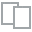
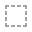
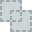
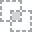
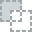
...
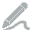
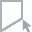
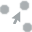
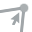
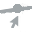

In [3]:
### MISSING DATA STATUS
# check missing data.
plot_missing(engagementdata)

# NOTE: YOU MAY CLICK ON ANY OF FIVE (Stats, Bar Chart, Spectrum, Heat Map, Dendrogram) OPTIONS FOR APPROPRIATE VIEWING

In [4]:
### CLEAN THE DATA
# initiate cleaning procedure.
inferred_dtypes, cleaned_df = clean_df(engagementdata)

# remove all rows with missing values.
cleaned_df = clean_df(engagementdata,standardize_missing_values='remove')

# convert turple to dataframe.
ENGAGEMENTDATACLEANED = pd.DataFrame(cleaned_df[1]) 

# print dataset.
print(ENGAGEMENTDATACLEANED)

Data Type Detection Report:
	These data types are supported by DataPrep to clean: []
Column Headers Cleaning Report:
No Headers Cleaned.
Downcast Memory Report:
	Memory reducted from 2098279429 to 1830389149. New size: (87.23%)
Data Type Detection Report:
	These data types are supported by DataPrep to clean: []
Column Headers Cleaning Report:
No Headers Cleaned.
Number of Entries Cleaning Report:
	5378889 entries dropped (24.09%)
Downcast Memory Report:
	Memory reducted from 1728291557 to 1524947945. New size: (88.23%)
                time  lp_id  pct_access  engagement_index
0         2020-01-01  17941        0.03               0.9
1         2020-01-01  65358        0.03               1.2
2         2020-01-01  98265        0.57         37.790001
3         2020-01-01  90153        0.06               3.9
4         2020-01-01  29322        0.06               5.1
...              ...    ...         ...               ...
16945296  12/31/2020  57371        0.04              3.94
16945297  1

In [5]:
### # an application of model suggested through TPOT implimentation
### DEFINE MODEL

# define the ExtraTreesRegressor model
df = pd.read_csv('C:/Users/Owner/Desktop/datefloatpctaccessengagementindex.csv', sep=',', dtype=np.float64)
X = df[['pct_access','date_float']].values.reshape((df.shape[0],2))
y = df['target'].values                                                         
                                                          
ExtraTreesRegressor(max_features=0.6000000000000001, min_samples_leaf=2,
                    min_samples_split=14).fit(X,y)
model = ExtraTreesRegressor(max_features=0.6000000000000001, min_samples_leaf=2,
                    min_samples_split=14).fit(X,y)

training_features, testing_features, training_target, testing_target = \
            train_test_split(X, df['target'], random_state=None)


# determine and print the model training score.
trainingscore = model.score(training_features, training_target)
#print("Training score: ", trainingscore)

# apply the cross-validation method to evaluate the training score.
# print the training score.
scoresE = cross_val_score(model, training_features, training_target,cv=10)
Ext = scoresE
#print("Mean cross validation training score: %.2f" % Ext.mean())

# NOTE: The model is around 95 % accurate on average.

# predict test data and check the prediction accuracy.
# used MSE and RMSE as accuracy metrics.
#exctracted_best_model = tpot.fitted_pipeline_.steps[-1][1]
predict_target = model.predict(testing_features)
mse = mean_squared_error(testing_target, predict_target)
#print("MSE: %.2f" % mse)
#print("RMSE: %.2f" % (mse**(1/2.0)))

# train the `exctracted_best_model` using THE WHOLE DATASET.
# used the whole dataset in order to get feature importance for all the
# features in the dataset.
X = df[['pct_access','date_float']].values.reshape((df.shape[0],2))
y = df['target'].values
model.fit(X, y) 

# get the predicted values.
predict_target = model.predict(testing_features)

predict_target

array([ 38.40263545, 289.37985818, 292.74536151,  91.45903131,
        99.25271818, 192.98569075, 178.6480525 ,  94.85039998,
        66.36849742,  82.87823254, 277.076348  ,  47.59991698,
       134.26604677,  95.12797418, 237.85540717, 178.63398085,
       302.77978184, 295.95094398,  84.61438454, 167.91780726,
       134.80720238,  41.1271396 ,  58.66044061,  97.36359763,
       180.31369518, 288.39473157,  93.58291033, 295.43628446,
       292.8884376 ,  46.17231092, 284.19845181,  38.79926782,
       112.16027784, 276.14654526, 292.60843844, 117.28291209,
        39.72340143, 202.60005973,  38.14248939, 288.92978832,
        64.78181955, 244.46150076, 177.24659188, 257.80616956,
        66.82097214,  38.00540008,  76.52665451,  38.60565684,
        67.77387099, 177.68614541,  93.85854021, 115.25450096,
        90.33248355,  92.80557791,  39.65243865, 293.49120036,
        38.79923441, 289.32335754, 290.41928802, 302.40660883,
       303.86061073, 291.47305062, 287.22624273, 270.70

In [6]:
### DESCRIPTION OF THE DIFFERENCES BETWEEN ORIGINAL AND PREDICTED VALUES

# determine the difference between original and predicted values of engagement_index
pred_y_df = pd.DataFrame({'Original':testing_target,'Predicted':predict_target,'Difference':testing_target - predict_target})
print(pred_y_df)
pred_y_df['Difference'].describe()

       Original   Predicted  Difference
220   31.546704   38.402635   -6.855931
257  298.318864  289.379858    8.939006
243  331.582297  292.745362   38.836935
305   87.532851   91.459031   -3.926181
340   89.260268   99.252718   -9.992450
..          ...         ...         ...
357  180.000276  145.983702   34.016574
90   324.512433  290.225148   34.287285
168   39.804443   50.364535  -10.560093
98   274.965455  271.260031    3.705424
221   29.392593   38.957593   -9.564999

[92 rows x 3 columns]


count    92.000000
mean     -1.031627
std      21.164231
min     -50.810594
25%     -13.307714
50%      -6.162630
75%       8.261921
max      71.123923
Name: Difference, dtype: float64

Text(0.5, 1.0, 'Original engagement_index vs Predicted engagement_index')

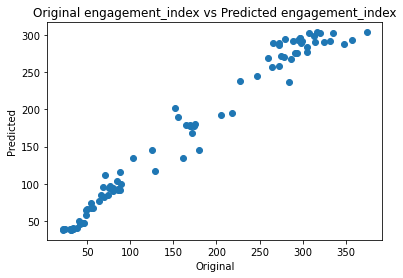

In [7]:
### VISUALISATION OF THE RESULTS

# a scatter plot of the results
plt.figure(figsize=(6,4))
plt.scatter(testing_target,predict_target)
plt.xlabel('Original')
plt.ylabel('Predicted')
plt.title('Original engagement_index vs Predicted engagement_index')

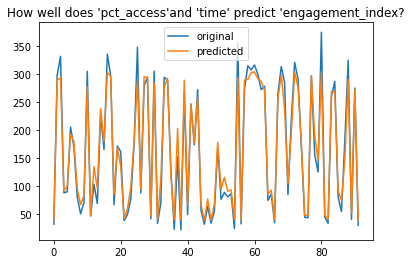

In [8]:
# a graphical visualization of the original and predicted 'engagement_index'.
x_ax = range(len(testing_target))
plt.plot(x_ax, testing_target, label="original")
plt.plot(x_ax, predict_target, label="predicted")
plt.title("How well does 'pct_access'and 'time' predict 'engagement_index?")
plt.legend()
plt.show()

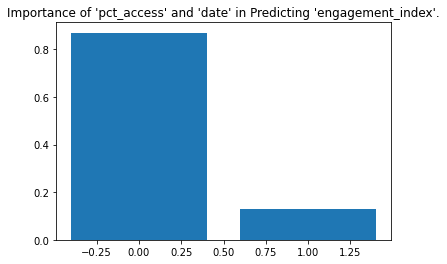

In [9]:
### FEATURE IMPORTANCES

# access features of the model
model.feature_importances_

# plot the features using barplot
positions= range(model.feature_importances_.shape[0],)
plt.bar(positions, model.feature_importances_)
plt.title("Importance of 'pct_access' and 'date' in Predicting 'engagement_index'.")
plt.show()

In [10]:
# compile and view the results of modeling for the question.

Accuracy_Results = pd.DataFrame({'ExtraTreesRegressor':[Ext.mean()]})
FeaturesImportance_Results = pd.DataFrame({'ExtraTreesRegressor(Feature_Importances)':model.feature_importances_})

Accuracy_Results  , FeaturesImportance_Results

(   ExtraTreesRegressor
 0             0.939467,
    ExtraTreesRegressor(Feature_Importances)
 0                                  0.869938
 1                                  0.130062)

<a id="">  Possible Direction for Policy(ies)</a> 

The model suggests that variables 'pct_access' and 'time' whether taken together or individually, play a role in determining the 'engagement_index'. 

Furthermore, the results suggest that 'pct_acess' (importance coefficient ~ 0.88) plays a much more important role than 'time' (importance coefficient ~ 0.12) in the determination of 'engagement_index'.  

Subsequently, a plausible suggestion is that policy makers on Digital Learning should take this relationship as a corner stone around which to formulate enduring, epidemic-tolerant and lasting policy(ies).

A good starting point might be to raise the 'pct_access' level of students through efforts that, will improve the general well being of the average student.